### FORECASTING TIME SERIES DATA USING ARIMA MODEL - TUTORIAL / PROJECT

In [98]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pandas.plotting import autocorrelation_plot
sns.set_theme(style='darkgrid')
import scipy.stats as stats
from random import seed
from random import random
from matplotlib import pyplot
from math import sqrt
import plotly.graph_objects as go
import warnings
import statsmodels.graphics.tsaplots as sgt
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.tsa.stattools as sts
from statsmodels.tsa.arima.model import ARIMA
from scipy.stats.distributions import chi2
import pylab

warnings.filterwarnings("ignore")

In [106]:
csv = pd.read_csv("C:/Users/J.C/Desktop/PROJECTS-CHINONSO/Data-Science-Projects/Projects/ARIMA/New folder/archive_3/rainfall.csv")

In [107]:
df = csv.copy()

df.head()

,datetime,temp,dew,humidity,sealevelpressure,winddir,solarradiation,windspeed,precipprob,preciptype
0,2016-01-01,28.4,11.9,37.8,1016.4,147.5,216.1,16.6,0,0
1,2016-01-02,26.8,13.0,44.8,1017.2,110.3,215.7,16.6,0,0
2,2016-01-03,25.5,14.6,52.8,1015.7,145.3,221.1,18.4,0,0
3,2016-01-04,26.4,13.1,46.6,1015.3,126.9,216.2,16.6,0,0
4,2016-01-05,27.1,13.5,44.9,1014.4,125.5,208.1,16.6,0,0


<Axes: >

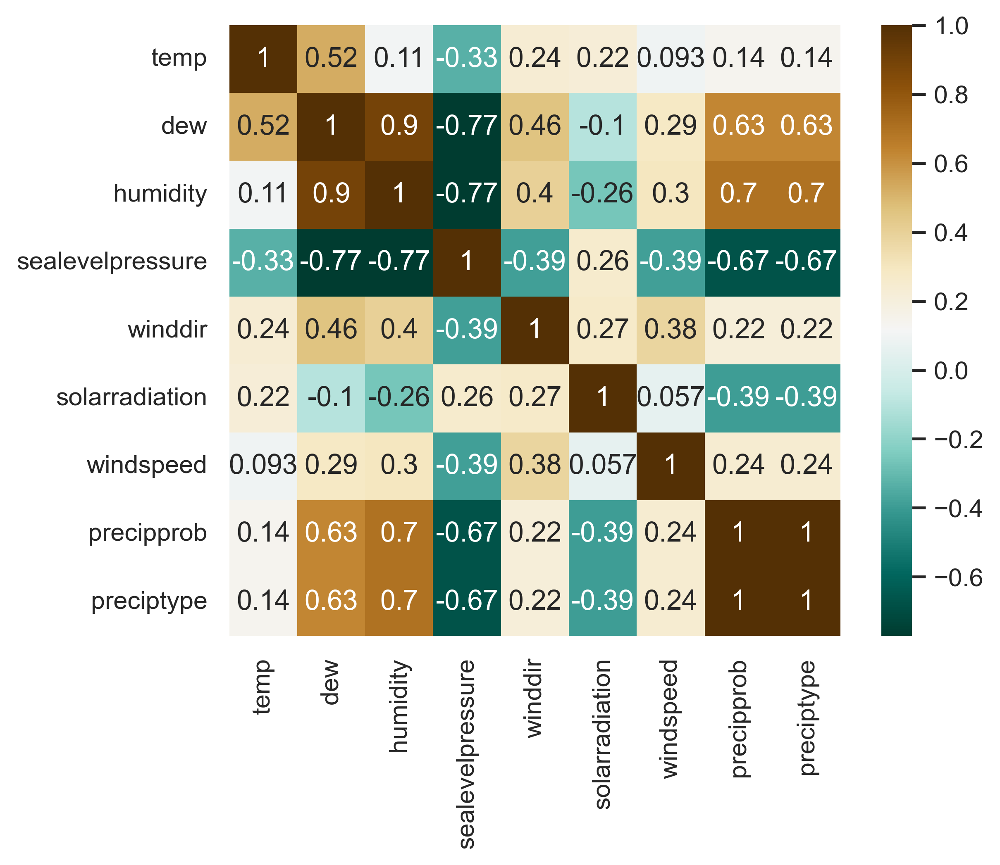

In [108]:
import matplotlib as mpl

mpl.rcParams['figure.dpi'] = 400

corr = df.drop(columns='datetime').corr()

sns.heatmap(corr, cbar=True, cmap='BrBG_r', annot=True, square=True)

### Humidity has the highest effect on precipitation probability

In [109]:
df.describe()
# print(len(df))

,temp,dew,humidity,sealevelpressure,winddir,solarradiation,windspeed,precipprob,preciptype
count,1766.000000,1766.000000,1766.000000,1766.000000,1766.000000,1766.000000,1766.000000,1766.000000,1766.000000
mean,28.336580,21.676727,69.703624,1008.850340,201.926954,228.231031,22.359513,46.036240,0.460362
std,1.966072,4.530189,14.502449,3.708306,46.708604,57.268286,6.362441,49.856756,0.498568
min,20.200000,5.000000,28.600000,994.100000,65.600000,52.800000,9.400000,0.000000,0.000000
25%,27.200000,18.125000,58.200000,1006.200000,164.725000,194.250000,18.400000,0.000000,0.000000
50%,28.500000,23.850000,71.700000,1009.100000,205.050000,232.800000,22.300000,0.000000,0.000000
75%,29.700000,25.300000,81.200000,1011.700000,241.325000,274.700000,24.600000,100.000000,1.000000
max,32.800000,27.500000,98.200000,1017.400000,316.000000,330.900000,128.100000,100.000000,1.000000


In [110]:
df.isna().sum()

datetime            0
temp                0
dew                 0
humidity            0
sealevelpressure    0
winddir             0
solarradiation      0
windspeed           0
precipprob          0
preciptype          0
dtype: int64

### We will use the Date column as index(x values) for the visualization

In [111]:
data = (df.assign(Date=lambda d: pd.to_datetime(d['datetime'])).set_index('Date').drop(columns='datetime')
 )

In [112]:
data

,temp,dew,humidity,sealevelpressure,winddir,solarradiation,windspeed,precipprob,preciptype
Date,,,,,,,,,
2016-01-01,28.4,11.9,37.8,1016.4,147.5,216.1,16.6,0,0
2016-01-02,26.8,13.0,44.8,1017.2,110.3,215.7,16.6,0,0
2016-01-03,25.5,14.6,52.8,1015.7,145.3,221.1,18.4,0,0
2016-01-04,26.4,13.1,46.6,1015.3,126.9,216.2,16.6,0,0
2016-01-05,27.1,13.5,44.9,1014.4,125.5,208.1,16.6,0,0
...,...,...,...,...,...,...,...,...,...
2020-10-27,29.9,20.3,58.2,1010.1,158.8,229.9,14.9,0,0
2020-10-28,29.6,22.3,65.6,1010.5,176.0,238.3,15.5,0,0
2020-10-29,29.3,23.0,69.7,1010.9,172.7,240.4,16.6,0,0


In [113]:
# data

### setting the frequency as monthly

In [114]:
data = data.asfreq('M')
len(data.index)

58

In [115]:
data.isna().sum()

temp                0
dew                 0
humidity            0
sealevelpressure    0
winddir             0
solarradiation      0
windspeed           0
precipprob          0
preciptype          0
dtype: int64

In [19]:

data

,temp,dew,humidity,sealevelpressure,winddir,solarradiation,windspeed,precipprob,preciptype
Date,,,,,,,,,
2016-01-31,26.4,18.3,62.3,1013.3,163.8,233.9,16.6,0,0
2016-02-29,27.7,21.4,69.6,1013.9,200.3,242.6,18.4,100,1
2016-03-31,28.3,22.1,70.6,1011.5,204.7,295.5,22.3,0,0
2016-04-30,29.9,24.0,71.4,1009.0,218.1,315.9,22.3,0,0
2016-05-31,31.8,25.4,69.4,1007.4,256.9,323.6,22.3,100,1
2016-06-30,27.1,25.2,90.0,1003.7,192.1,189.9,24.1,100,1
2016-07-31,26.7,25.2,91.9,1006.4,251.1,139.0,27.0,100,1
2016-08-31,28.1,24.6,81.6,1006.0,236.2,245.0,24.1,100,1
2016-09-30,27.9,23.5,77.8,1007.6,225.8,237.9,22.3,0,0


### Time Series Visuals

In [20]:
# df = data_2.dropna()

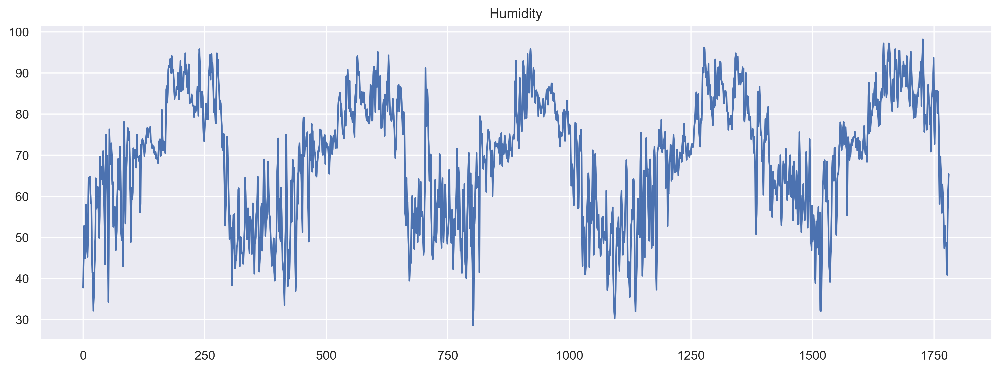

In [21]:
#visualizing the Adjusted close column column
df['humidity'].plot(figsize=(15,5), title="Humidity")
plt.show()

In [22]:
# #Volume plot
# df['humidity'].plot(figsize=(15,15), title="Volume")
# plt.show()

In [23]:
# df['Close'].plot(figsize=(15,5), title="Close")
# plt.show()

### White noise data for Adjusted Close

In [116]:
w_n = np.random.normal(loc=df['humidity'].mean(), scale=df['humidity'].std(), size=len(df))


In [117]:
df["w_n"] = w_n

In [118]:
df.w_n.describe()

count    1766.000000
mean       70.082063
std        14.461874
min        21.342942
25%        60.197005
50%        69.677274
75%        79.978344
max       119.657012
Name: w_n, dtype: float64

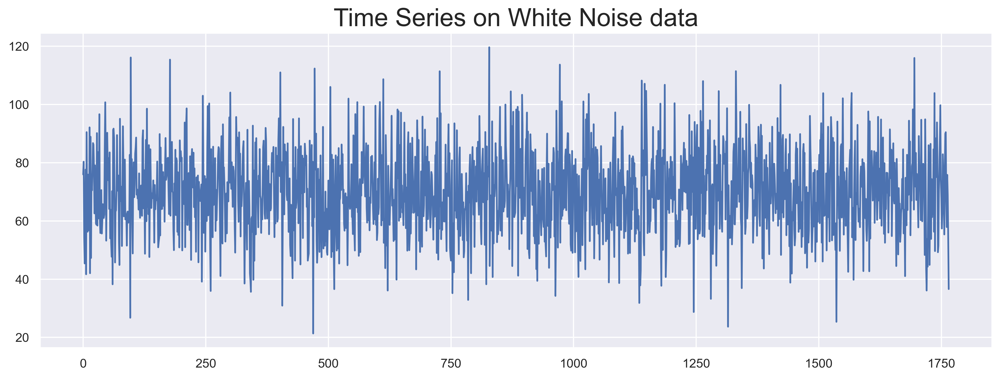

In [119]:
#plotting the white noise data

df.w_n.plot(figsize=(15,5))
plt.title("Time Series on White Noise data", size=22)
plt.show()

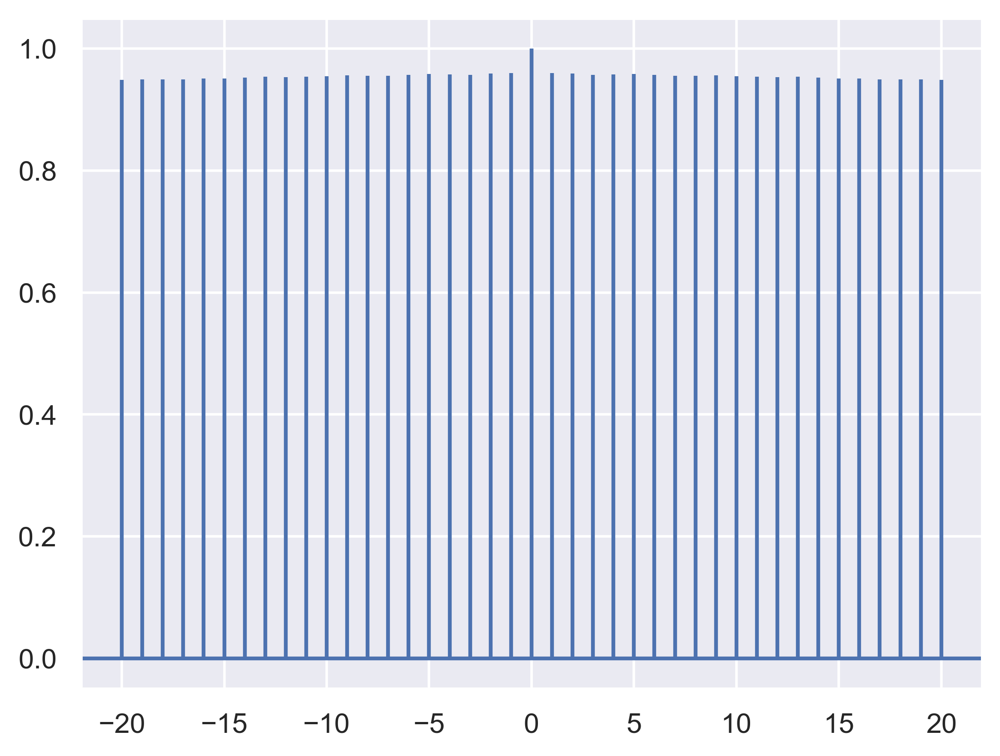

In [120]:
plt.acorr(df.w_n, maxlags=20)
plt.show()

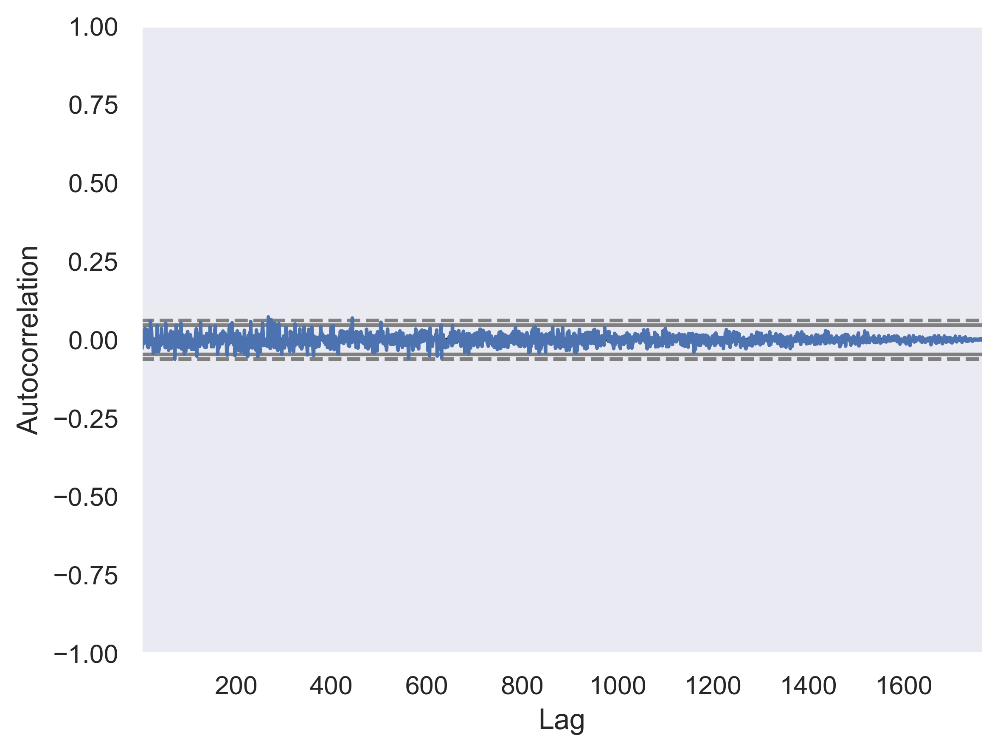

In [121]:
autocorrelation_plot(df.w_n)
plt.show()

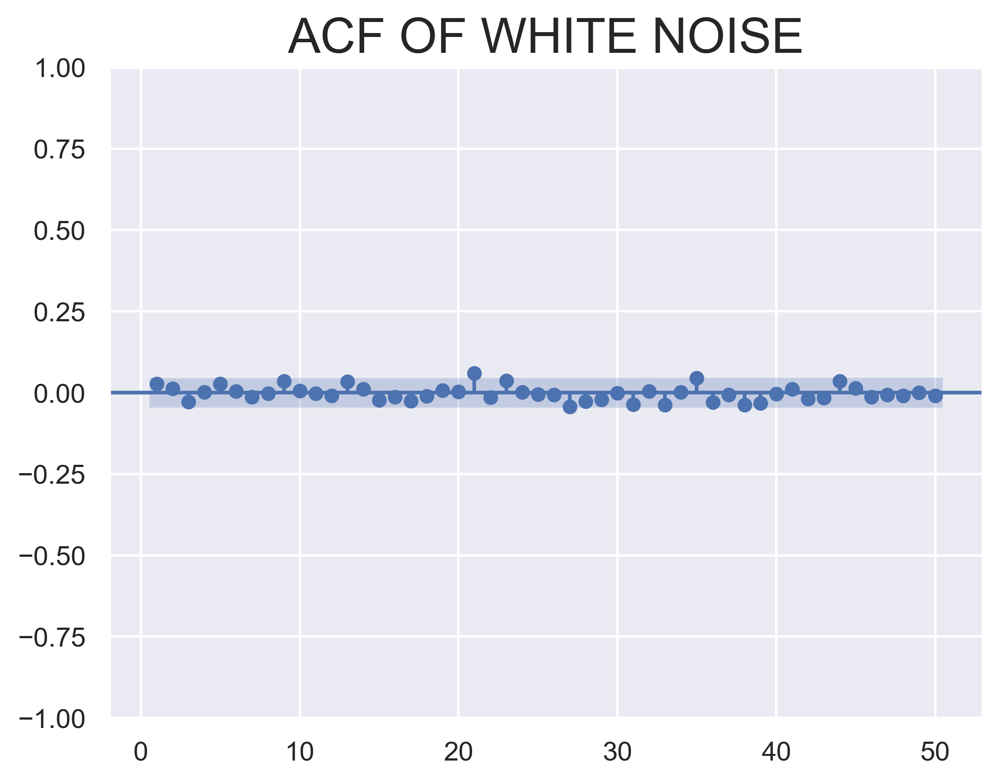

In [122]:
#SGT PLOT

sgt.plot_acf(df.w_n, zero = False, lags=50)
plt.title("ACF OF WHITE NOISE", size=20)
plt.show()

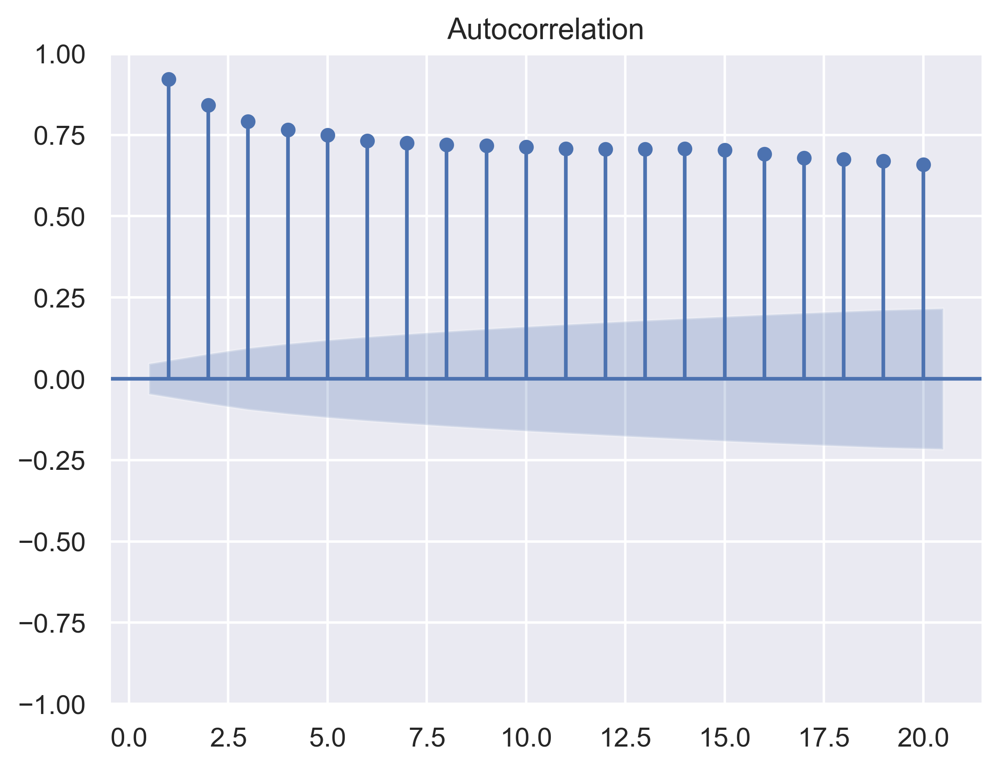

In [123]:
sgt.plot_acf(df['humidity'], zero= False, lags=20)
plt.show()

### Random Walk

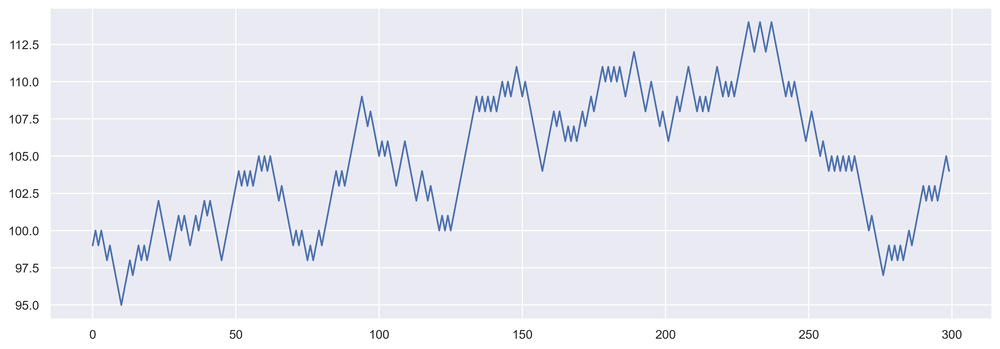

In [124]:
walk = [99]
noise1 = []

for i in range(2000):
    noise = -1 if np.random.random() < 0.5 else 1
    noise1.append(noise)
    walk.append(walk[i] + noise)

plt.figure(figsize=(15,5))
plt.plot(walk[:300])

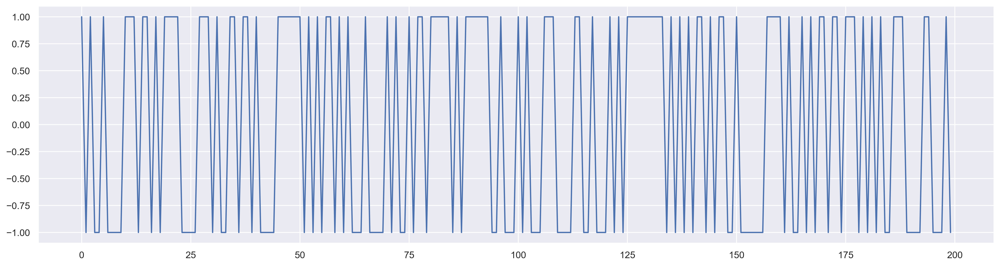

In [125]:
plt.figure(figsize=(20,5))
plt.plot(noise1[:200])

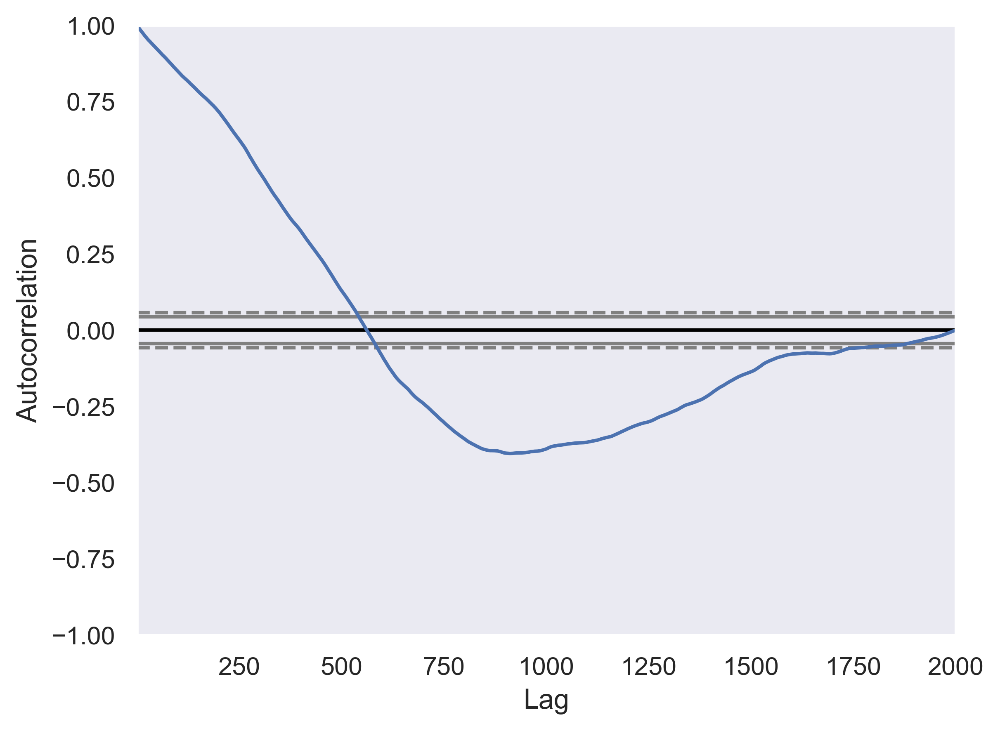

In [126]:
autocorrelation_plot(walk)
plt.show()

### Stationarity Check

In [127]:
sts.adfuller(df['humidity'])

(-3.154012964595648,
 0.02280573441818237,
 13,
 1752,
 {'1%': -3.4340879605755426,
  '5%': -2.8631911014332876,
  '10%': -2.567648997323346},
 10774.973325567935)

In [128]:
# CAN WE PROVE THAT THE DATA IS NOT STATIONARY
test_statistic, p_value, used_lag, n_obs, critical_values, maximized_information_criterion = sts.adfuller(df['humidity'])

for k,v in critical_values.items():
    if test_statistic < v:
        print("Data is stationary with a %.2f%% of confidence" % (1-(float(k.rstrip('%')))/100))
    else:
        print("There isn't enough proof to reject that data isn't stationary with a %.2f%% of confidence"% (1-(float(k.rstrip('%')))/100))


There isn't enough proof to reject that data isn't stationary with a 0.99% of confidence
Data is stationary with a 0.95% of confidence
Data is stationary with a 0.90% of confidence


### The test statistic is -0.87, p-value is 0.79 which is greater than 0.5 hence we fail to reject the null hypothesis. This means that the time series is not stationary implying that is has some time-dependent structure and has not have constant variance over time.

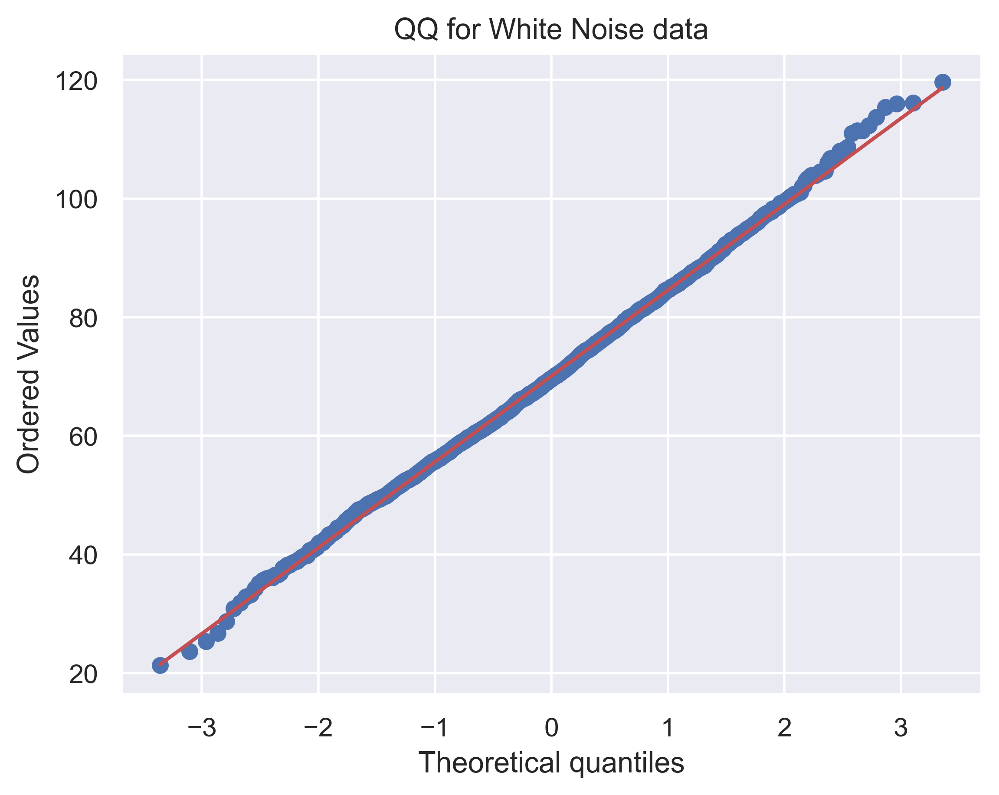

In [129]:
#QQ plot for gausian test

scipy.stats.probplot(df['w_n'], plot=pylab)
plt.title("QQ for White Noise data")
pylab.show()

### Seasonality

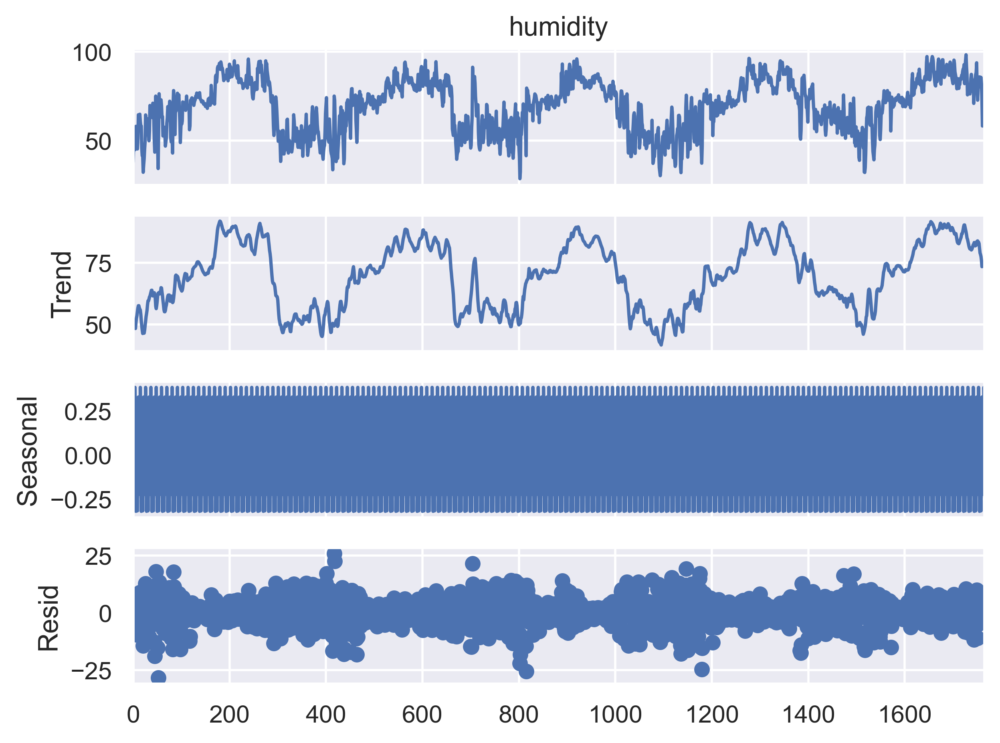

In [130]:
#Naive decomposition Additive / Multiplicative

additive = seasonal_decompose(df['humidity'], model="additive", period=11)
additive.plot()
plt.show()

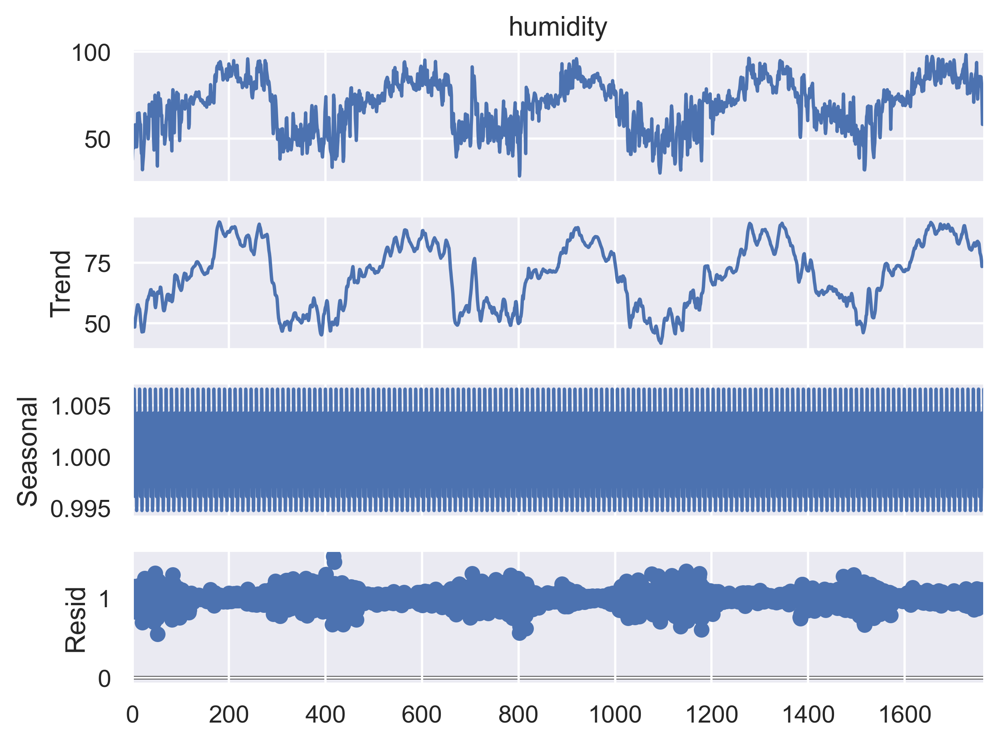

In [131]:
multiplicative = seasonal_decompose(df['humidity'], model="multiplicative", period=11)
multiplicative.plot()
plt.show()

### Holt Winter Exponential Smoothing

In [132]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

In [133]:
h_model = ExponentialSmoothing(df['humidity'].tolist())
model_fit = h_model.fit()

In [134]:
yhat = model_fit.predict(1, len(df))
#to predict all datapoints that are same as the dataset

# df.head()

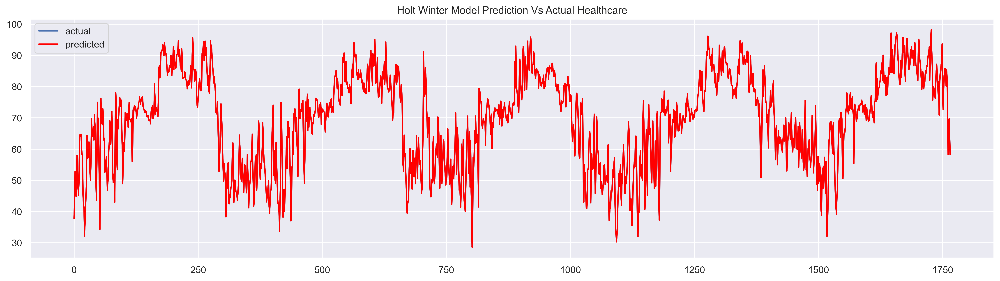

In [135]:
plt.figure(figsize=(20,5))
plt.plot(df['humidity'].tolist())
plt.plot(yhat.tolist(), color='red')
plt.title("Holt Winter Model Prediction Vs Actual Healthcare")
plt.legend(["actual", "predicted"])

plt.show()

### ARIMA TESTS

In [184]:
# define a function for LLR test
def LLR_test(mod_1, mod_2, DF=1):
    L1 = mod_1.fit().llf
    L2 = mod_2.fit().llf
    LR = (2*(L2-L1))
    p = chi2.sf(LR, DF).round(3)
    return p

def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)

    return np.array(diff)

def inverse_difference(history, yhat, interval=1):
    history = list(history)

    n = len(yhat) 
    if len(yhat) ==1:
        value = yhat[i] + history[-interval]
        history.append(value)
    else:
        value = yhat[0] + history[-interval]
        history.append(value)

        for i in range(1, n):
            value = yhat[i] + history[-interval]
            history.append(value)
    return np.array(history[-n:])

### Making the data Stationary

### another way to do the differencing without using the difference function above 

In [137]:
df["delta_humidity"] = df['humidity'].diff(1)
df.index = pd.DatetimeIndex(df.datetime).to_period('D')
df.drop(columns='datetime')

,temp,dew,humidity,sealevelpressure,winddir,solarradiation,windspeed,precipprob,preciptype,w_n,delta_humidity
datetime,,,,,,,,,,,
2016-01-01,28.4,11.9,37.8,1016.4,147.5,216.1,16.6,0,0,75.975961,NaN
2016-01-02,26.8,13.0,44.8,1017.2,110.3,215.7,16.6,0,0,80.342994,7.0
2016-01-03,25.5,14.6,52.8,1015.7,145.3,221.1,18.4,0,0,54.341354,8.0
2016-01-04,26.4,13.1,46.6,1015.3,126.9,216.2,16.6,0,0,45.403598,-6.2
2016-01-05,27.1,13.5,44.9,1014.4,125.5,208.1,16.6,0,0,59.043367,-1.7
...,...,...,...,...,...,...,...,...,...,...,...
2020-10-27,29.9,20.3,58.2,1010.1,158.8,229.9,14.9,0,0,57.893097,-14.5
2020-10-28,29.6,22.3,65.6,1010.5,176.0,238.3,15.5,0,0,75.821950,7.4
2020-10-29,29.3,23.0,69.7,1010.9,172.7,240.4,16.6,0,0,68.912059,4.1


In [138]:
# df['delta_Adj_Close'].describe()
# df['delta_humidity']
df.head()


,datetime,temp,dew,humidity,sealevelpressure,winddir,solarradiation,windspeed,precipprob,preciptype,w_n,delta_humidity
datetime,,,,,,,,,,,,
2016-01-01,2016-01-01,28.4,11.9,37.8,1016.4,147.5,216.1,16.6,0,0,75.975961,NaN
2016-01-02,2016-01-02,26.8,13.0,44.8,1017.2,110.3,215.7,16.6,0,0,80.342994,7.0
2016-01-03,2016-01-03,25.5,14.6,52.8,1015.7,145.3,221.1,18.4,0,0,54.341354,8.0
2016-01-04,2016-01-04,26.4,13.1,46.6,1015.3,126.9,216.2,16.6,0,0,45.403598,-6.2
2016-01-05,2016-01-05,27.1,13.5,44.9,1014.4,125.5,208.1,16.6,0,0,59.043367,-1.7


In [139]:
x = df['humidity'].values

differenced = difference(x, 1)
print(differenced)
print(x)

[ 7.   8.  -6.2 ...  4.1 -4.1 -7.4]
[37.8 44.8 52.8 ... 69.7 65.6 58.2]


### Checking for Stationarity now omitting the first row which is nan

In [140]:
test_statistic, p_value, used_lags, n_obs, critical_values, maximized_info_criterion = sts.adfuller(differenced)

for k,v in critical_values.items():
    print(k, v, test_statistic)
    if test_statistic < v:
        print("Data is stationary with %.2f%% of confidence" % (1-(float(k.rstrip('%')))/100))
    else:
        print("Data is not stationary with %.2f%% of confidence" % (1-(float(k.rstrip('%')))/100))

1% -3.4340879605755426 -17.640250711648193
Data is stationary with 0.99% of confidence
5% -2.8631911014332876 -17.640250711648193
Data is stationary with 0.95% of confidence
10% -2.567648997323346 -17.640250711648193
Data is stationary with 0.90% of confidence


### ARIMA(1,1,1)

In [141]:
model_ar_1_i_1_ma_1 = ARIMA(df['humidity'], order=(1,1,1))
results_ar_1_i_1_ma_1 = model_ar_1_i_1_ma_1.fit()
results_ar_1_i_1_ma_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:               humidity   No. Observations:                 1766
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -5496.785
Date:                Thu, 21 Mar 2024   AIC                          10999.571
Time:                        00:51:02   BIC                          11015.999
Sample:                    01-01-2016   HQIC                         11005.641
                         - 10-31-2020                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7158      0.023     31.595      0.000       0.671       0.760
ma.L1         -0.9215      0.014    -65.480      0.000      -0.949      -0.894
sigma2        29.6823      0.660     44.957      0.000      28.388      30.976
===================================================================================
Ljung-Box (L1) (Q):                  28.82   Jarque-Bera (JB):               605.71
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.79   Skew:                             0.24
Prob(H) (two-sided):                  0.01   Kurtosis:                         5.83
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Key facts to note in the results of ARIMA 
    1. Our goal is to maximize the Log Likelihood
    2. The middle parameter in the ARIMA(p,d,q) that is d-parameter helps to convert out data 
        stationary form by differencing technique
    3. The log likelihood test LLR TEST checks to see if a more complex model doesnt give a better prediction or not.

SUMMARY:
    Here what we’re looking for, is to maximize LL (Log Likelihood) and to Minimize AIC .

The fewer the coefficients a model has, the less data it requires to make the predictions and the more accurate they are, however, the more complex the model, the more data it will need and the less accurate it will be.

AIC: what it does is to evaluate the collection of models we are analyzing and estimate the quality of each model in relation to the remaining models. The most important, is that the criteria will penalize the models based on the number of parameters they have, that is, based on their complexity.

BIC: It is very similar to AIC except that the mathematics behind this criterion is based on Bayesian methods.

And you remeber the LLR_test?

Log likelihood test: To see if a more complex model doesn’t give better predictions or not. As a general rule we will prefer models with a higher probability of the logarithm of the likelihood.

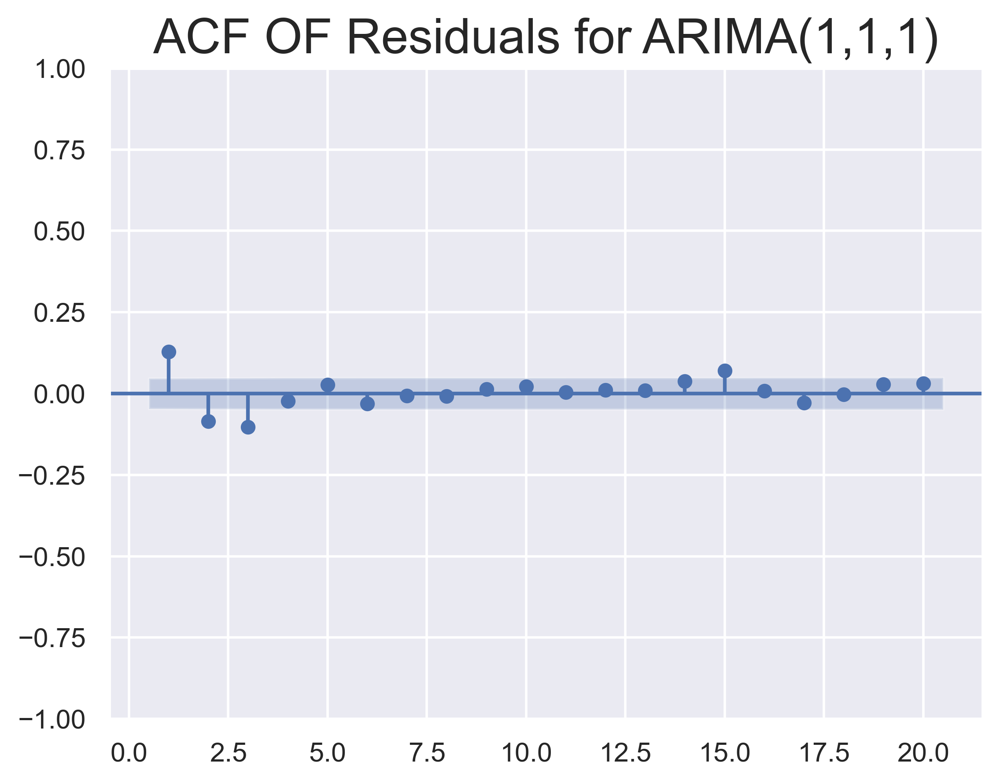

In [142]:
#PLOTTING ARIMA(1,1,1)
df['res_ar_1_1_1_ma_1'] = results_ar_1_i_1_ma_1.resid
sgt.plot_acf(df.res_ar_1_1_1_ma_1, zero=False, lags=20)
plt.title("ACF OF Residuals for ARIMA(1,1,1)", size=20)
plt.show()

### USING HIGHER

In [222]:
model_ar_1_0_1 = ARIMA(df.humidity, order=(1,0,1))
results_ar_1_0_1 = model_ar_1_0_1.fit()

model_ar_1_1_0 = ARIMA(df.humidity, order=(1,1,0))
results_ar_1_1_0 = model_ar_1_1_0.fit()

model_ar_1_1_1 = ARIMA(df.humidity, order=(2,1,2))
results_ar_1_1_1 = model_ar_1_1_1.fit()
# results_ar_1_1_1.summary()



### Model ARIMA(1,1,1) on Differenced values

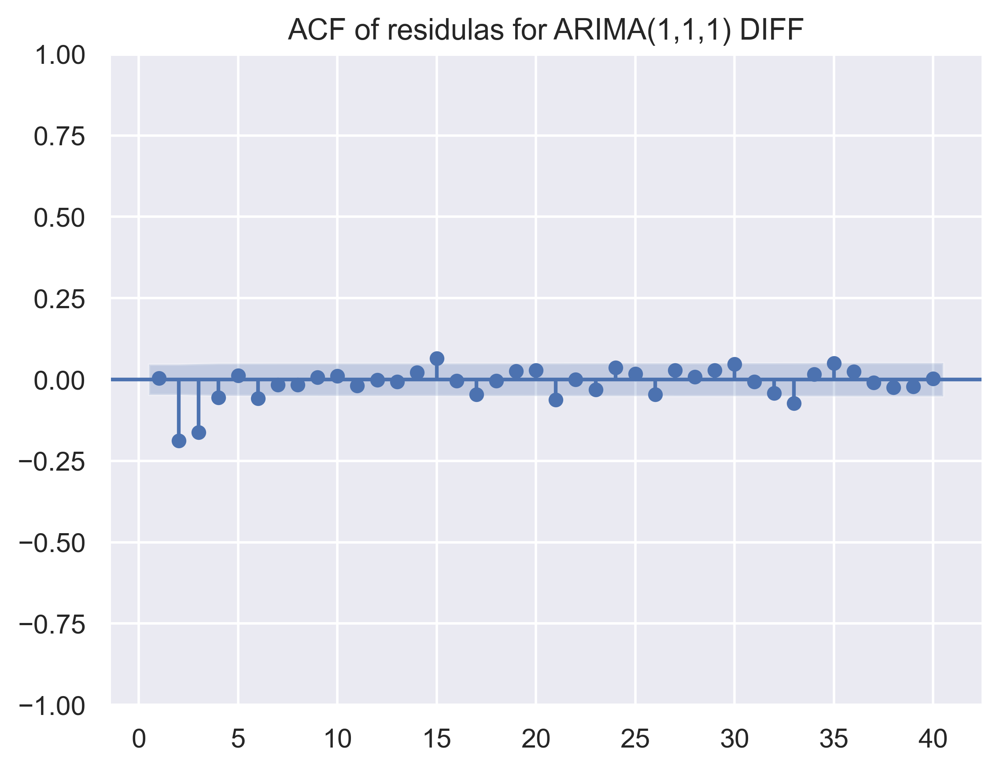


 LLR for Arima(1,1,,1) diff =  -5570.128284178536 	 AIC = 11146.256568357072

 LLR for Arima(2,1,2)-diff =  -5466.270993937321 	 AIC = 10942.541987874642


In [247]:
#difference arima
model_ar_1_1_1_diff = ARIMA(differenced, order=(1,1,1))
results_ar_1_1_1_diff = model_ar_1_1_1_diff.fit()

model_ar_2_1_2_diff = ARIMA(differenced, order=(2,1,2))
results_ar_2_1_2_diff = model_ar_2_1_2_diff.fit()


df['results_arima_1_1_1_diff'] = np.concatenate(([0], results_ar_1_1_1_diff.resid))
df.head()

sgt.plot_acf(df.results_arima_1_1_1_diff[1:], zero = False, lags=40)
plt.title("ACF of residulas for ARIMA(1,1,1) DIFF")
plt.show()

print("\n LLR for Arima(1,1,,1) diff = ", results_ar_1_1_1_diff.llf, "\t AIC =", results_ar_1_1_1_diff.aic)
print("\n LLR for Arima(2,1,2)-diff = ", results_ar_2_1_2_diff.llf, "\t AIC =", results_ar_2_1_2_diff.aic)

### From the above we see that Arima(2,1,2)-diff has lower AIC thatn Arima(1,1,1)-diff and also higher LLR

### 

In [249]:
# results_ar_1_1_1_diff.summary()
# results_ar_2_1_2_diff.summary()

### 

### STATIONARITY FACTS

When it comes to time series forecasting, the stationarity of a time series is one of the most important conditions that the majority of algorithms require. Briefly, time-series S_{t} is stationary (weak stationarity) if these conditions are met:

S_{t} has a constant mean.
S_{t} has a constant standard deviation.
There is no seasonality in S_{t}. If S_{t} has a repeating pattern within a year, then it has seasonality.

In [223]:
print("ARIMA(1,0,1): \t LL =", results_ar_1_0_1.llf, "\t AIC = ", results_ar_1_0_1.aic)
print("ARIMA(1,1,0): \t LL =", results_ar_1_1_0.llf, "\t AIC = ", results_ar_1_1_0.aic)
print("ARIMA(1,1,1): \t LL =", results_ar_1_1_1.llf, "\t AIC = ", results_ar_1_1_1.aic)

ARIMA(1,0,1): 	 LL = -5535.296625371897 	 AIC =  11078.593250743794
ARIMA(1,1,0): 	 LL = -5569.061541123423 	 AIC =  11142.123082246846
ARIMA(1,1,1): 	 LL = -5463.964005923832 	 AIC =  10937.928011847664


### It appears ARIMA(1,1,1) still performs better than ARIMA(1,1,1)DIFF WITH LOWER AIC AND HIGHER LL

In [224]:
#Checking with LRR Test
print("\nLLR Test p-value = " + str(LLR_test(model_ar_1_0_1, model_ar_1_1_0, DF=2)))


LLR Test p-value = 1.0


In [225]:
# diff_model = ARIMA(differenced, order=(1,1,1))
# result_1 = diff_model.fit()
# result_1

In [226]:
print("\nLLR Test p-value = " + str(LLR_test(model_ar_1_0_1, model_ar_1_1_0, DF=1)))


LLR Test p-value = 1.0


In [227]:
print("\nLLR Test p-value = " + str(LLR_test(model_ar_1_0_1, model_ar_1_1_1, DF=2)))


LLR Test p-value = 0.0


In [228]:

model1 = model_ar_1_0_1
model2 = model_ar_1_1_1
DF = 1
if LLR_test(model1, model2, DF =DF) < .05:
    print("LLR test p-value = " + str(LLR_test(model1, model2, DF =DF)))
    print("There is enough evidence that {model2} is statiscally significant than {model1}".format(model2="ARIMA(1,1,1)", model1="ARIMA(1,0,1)"))
else:
    print("LLR test p-value = " + str(LLR_test(model1, model2, DF =DF)))
    print("There isn't enough evidence that {model2} is statiscally significant than {model1}".format(model2="ARIMA(1,1,1)", model1="ARIMA(1,0,1)"))


LLR test p-value = 0.0
There is enough evidence that ARIMA(1,1,1) is statiscally significant than ARIMA(1,0,1)


### 

ALSO ARIMA(1,1,1) IS  STATISTICALLY SIGNIFICANT THAN ARIMA(1,1,0)

ARIMA 111 HAS THE LEAST AIC AND HIGHEST LOG LIKELIHOOD 

BUT THIS CHANGES USING THE DIFFERENCED VALUES

ARIMA 212 ALSO HAS THE LEAST AIC AND HIGHEST LLR OF THE THREE

### 

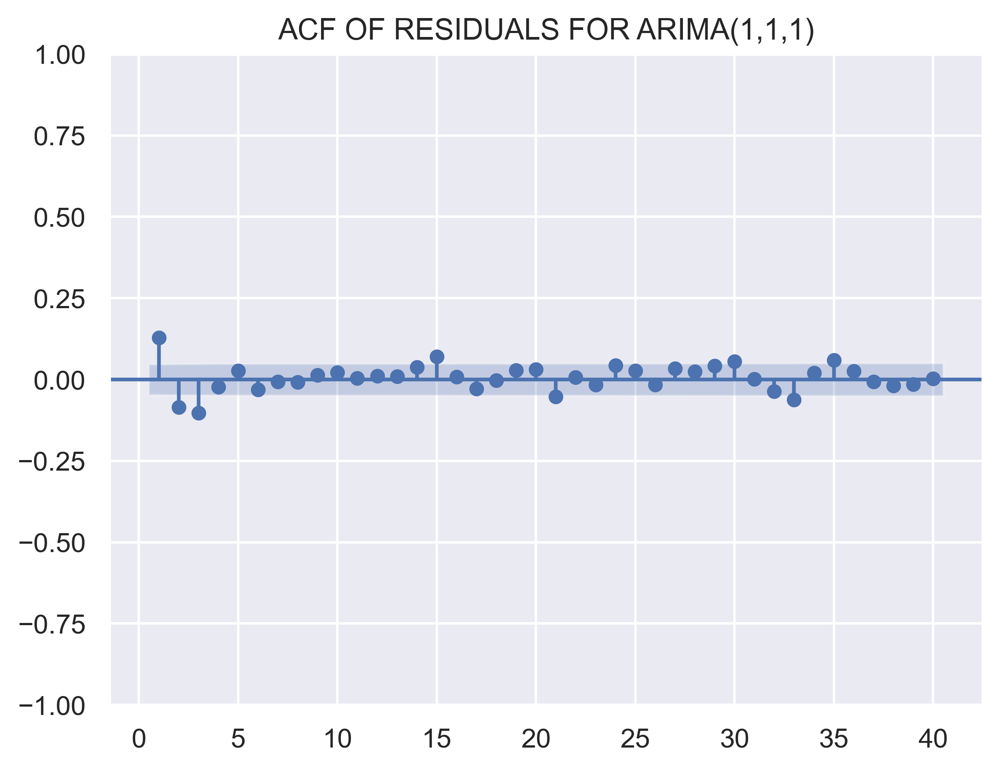

In [189]:
#PLOTTING THE RESIDUAL FOR ARIMA(1,1,1)

df['res_ar_1_1_1'] = results_ar_1_1_1.resid
sgt.plot_acf(df.res_ar_1_1_1, zero = False, lags = 40)
plt.title("ACF OF RESIDUALS FOR ARIMA(1,1,1)")
plt.show()

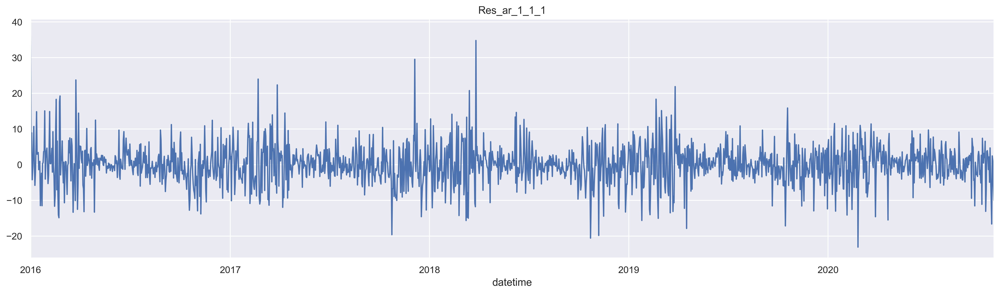

In [250]:
df.res_ar_1_1_1.plot(figsize=(20,5), title="Res_ar_1_1_1")
plt.show()
# df.res_ar_1_1_1

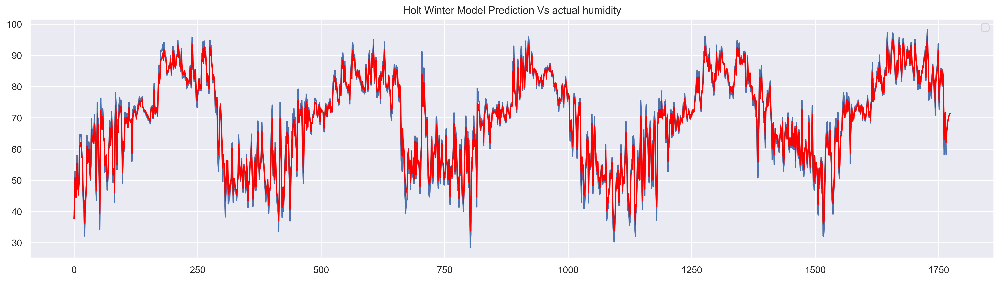

In [152]:
yhat = results_ar_1_1_1.predict(1, len(df)+8)

plt.figure(figsize=(20,5))
plt.plot(df.humidity.tolist())
plt.plot(yhat.tolist(), color='red')
plt.title("Holt Winter Model Prediction Vs actual humidity")
plt.legend("actual", "predicted")

plt.show()

### Using higher levels of integration

In [153]:
df['delta_humidity'] = df.humidity.diff(2)

In [154]:
df['delta_humidity'].head()

datetime
2016-01-01     NaN
2016-01-02     NaN
2016-01-03    15.0
2016-01-04     1.8
2016-01-05    -7.9
Freq: D, Name: delta_humidity, dtype: float64

In [155]:
#check for stationarity
test_statistic, p_value, used_lags, n_obs, critical_values, maximized_info_criterion = sts.adfuller(df.delta_humidity[2:])

for k,v in critical_values.items():
    print(k, v, test_statistic)
    if test_statistic < v:
        print("Data is stationary with %.2f%% of confidence" % (1-(float(k.rstrip('%')))/100))
    else:
        print("Data is not stationary with %.2f%% of confidence" % (1-(float(k.rstrip('%')))/100))

1% -3.4341137777946718 -10.781755693245149
Data is stationary with 0.99% of confidence
5% -2.8632024980220288 -10.781755693245149
Data is stationary with 0.95% of confidence
10% -2.56765506572863 -10.781755693245149
Data is stationary with 0.90% of confidence


In [156]:
#fitting the model again

model_ar_1_2_1 = ARIMA(df.humidity, order=(1,2,1))
results_ar_1_2_1 = model_ar_1_2_1.fit()
results_ar_1_2_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:               humidity   No. Observations:                 1766
Model:                 ARIMA(1, 2, 1)   Log Likelihood               -5570.128
Date:                Thu, 21 Mar 2024   AIC                          11146.257
Time:                        00:51:31   BIC                          11162.683
Sample:                    01-01-2016   HQIC                         11152.327
                         - 10-31-2020                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0197      0.019      1.046      0.295      -0.017       0.057
ma.L1         -0.9998      0.053    -18.796      0.000      -1.104      -0.896
sigma2        32.2481      1.822     17.696      0.000      28.676      35.820
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):               738.55
Prob(Q):                              0.88   Prob(JB):                         0.00
Heteroskedasticity (H):               0.80   Skew:                             0.34
Prob(H) (two-sided):                  0.01   Kurtosis:                         6.10
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

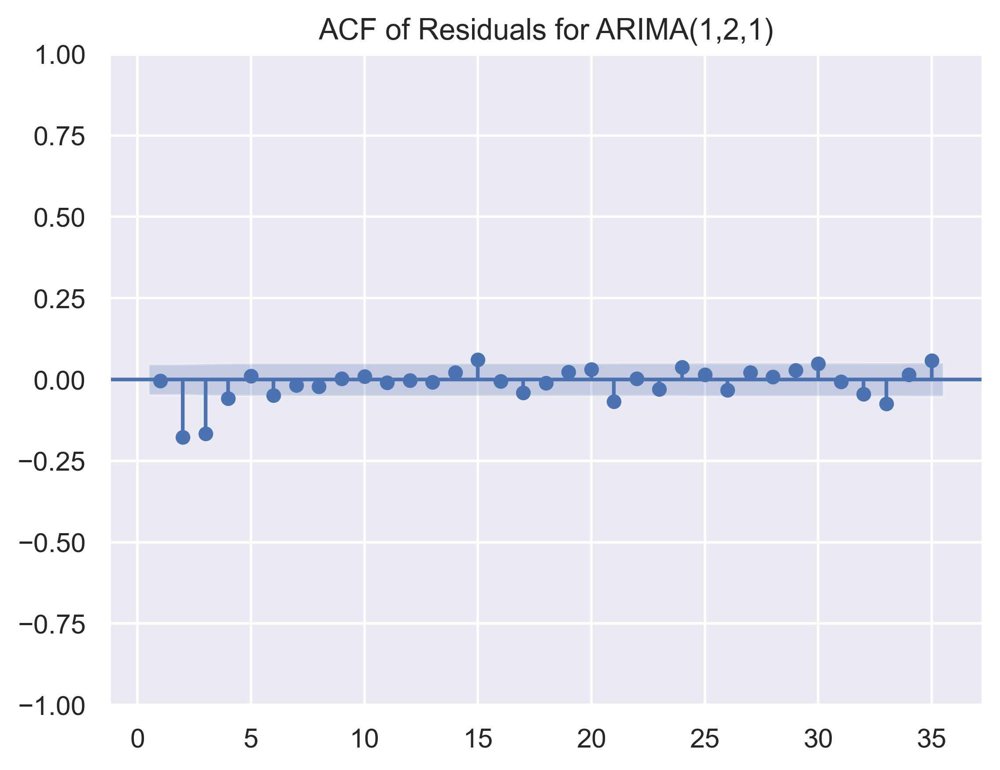

In [157]:
df['res_1_2_1'] = results_ar_1_2_1.resid.iloc[:]
sgt.plot_acf(df.res_1_2_1, zero = False, lags=35)
plt.title("ACF of Residuals for ARIMA(1,2,1)")
plt.show()

### PREDICTING ON WEEKLY BASIS

In [264]:
forecast_diff_arima_1_1_1 = results_ar_1_1_1_diff.forecast(7)[0:7]
forecast_diff_arima_2_1_2 = results_ar_2_1_2_diff.forecast(7)[0:7]


#return predictions to original scale
predictions_1_1_1_diff = inverse_difference(df.humidity, forecast_diff_arima_1_1_1, interval=1)
predictions_2_1_2_diff = inverse_difference(df.humidity, forecast_diff_arima_2_1_2, interval=1)

#using an evaluation metric RMSE from sklearn
from sklearn.metrics import mean_squared_error
from math import sqrt

test_data = pd.read_excel("C:/Users/J.C/Desktop/PROJECTS-CHINONSO/Data-Science-Projects/Projects/ARIMA/New folder/archive_3/test.xlsx")

df_test = test_data.copy()

print("\n RSME for Arima_1_1_1_diff = ", sqrt(mean_squared_error(df_test['humidity'][0:7].values, predictions_1_1_1_diff)))

print("\n RSME for ARIMA_2_1_2_diff = ", sqrt(mean_squared_error(df_test['humidity'][0:7].values, predictions_2_1_2_diff)))


print("\n Predicted values for Arima_1_1_1_diff: ")
np.vstack(predictions_1_1_1_diff)


 RSME for Arima_1_1_1_diff =  5.553480442505925

 RSME for ARIMA_2_1_2_diff =  14.585159107766177

 Predicted values for Arima_1_1_1_diff: 


array([[58.06489683],
       [58.07303523],
       [58.08399792],
       [58.09501629],
       [58.10603577],
       [58.11705526],
       [58.12807475]])

### Our root mean squared error returned 5.55 for ARIMA(1,1,1) DIFF. 

TESTING OUT ON ARIMA 111

In [265]:
forecast_arima_1_1_1 = results_ar_1_1_1.forecast(7)[0:7]

sqrt(mean_squared_error(df_test['humidity'][0:7].values, forecast_arima_1_1_1))
# forecast_arima_1_1_1


14.526888426328682

### Comparing the two RMSE values, we can agree that ARIMA(1,1,1) performs Worse than ARIMA(1,1,1)_DIFF

GENERALLY ARIMA_111-DIFF PERFORMS BEST ON TEST

### 

### SARIMAX

    SARIMA is an alternative version of arima that extends the funcitonalities obtainable by adding a seasonal componenent. Its addss three parameteres: 
        1. P - Seasoanl autoregressive order
        2. D - Seasonal difference order
        3. Q - Seasonal moving average order
        4. m - number of time steps for a single seasonal period

In [159]:
from statsmodels.tsa.statespace.sarimax import SARIMAX


In [292]:
#fitting the model

model_sarimax_1_1_1 = SARIMAX(df.humidity, order=(1,1,1), seasonal_order=(1,0,1,7))
results_sarimax_1_1_1 = model_sarimax_1_1_1.fit()


model_sarimax_1_1_1_diff = SARIMAX(differenced, order=(1,1,1), seasonal_order=(1,0,1,7))
results_sarimax_1_1_1_diff = model_sarimax_1_1_1_diff.fit()

print("\n LLR for Sarimax_model_1_1_1 = ", results_sarimax_1_1_1.llf, "\t AIC = ", results_sarimax_1_1_1.aic)
print("\n LLR for Sarimax_model_1_1_1_diff = ", results_sarimax_1_1_1_diff.llf, "\t AIC = ", results_sarimax_1_1_1_diff.aic)
# results_sarimax.summary()


 LLR for Sarimax_model_1_1_1 =  -5495.650751208933 	 AIC =  11001.301502417866

 LLR for Sarimax_model_1_1_1_diff =  -5568.942594787041 	 AIC =  11147.885189574083


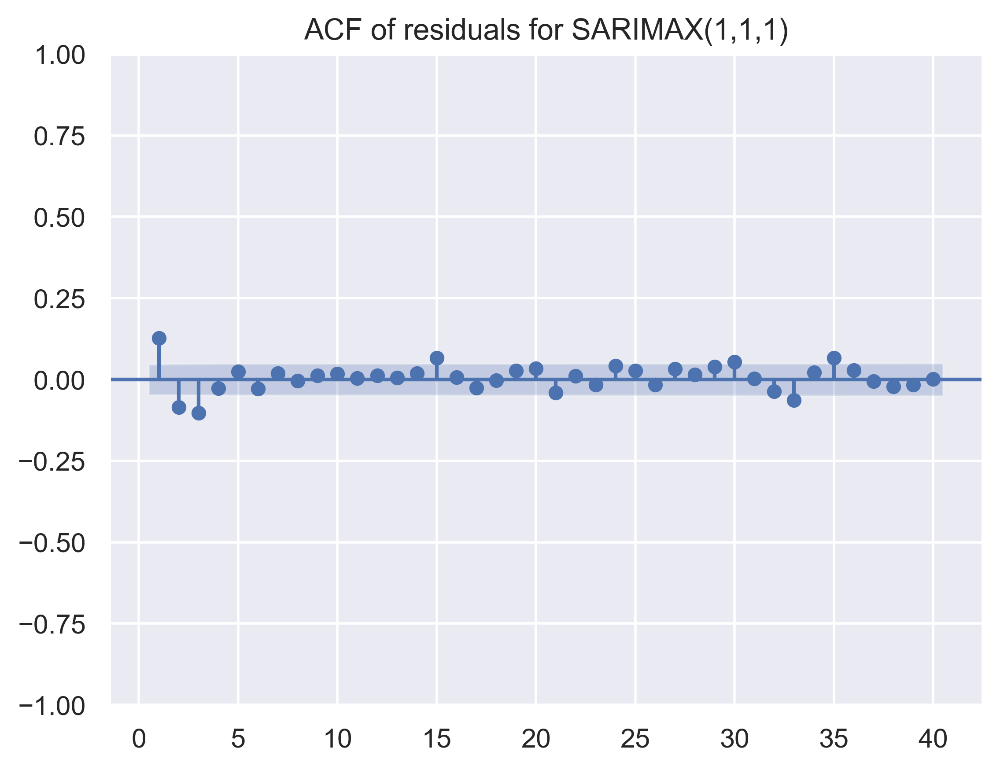

In [282]:
df['results_sarimax'] = results_sarimax.resid.iloc[:]
sgt.plot_acf(df.results_sarimax, zero = False, lags =40)
plt.title("ACF of residuals for SARIMAX(1,1,1)")
plt.show()

### TRYING P,Q VALUES OF 2

In [302]:
model_sarimax_2_1_2 = SARIMAX(df.humidity, order=(2,1,2), seasonal_order=(1,0,1,7))
results_sarimax_2_1_2 = model_sarimax_2_1_2.fit()


model_sarimax_2_1_2_diff = SARIMAX(differenced, order=(2,1,2), seasonal_order=(1,0,1,7))
results_sarimax_2_1_2_diff = model_sarimax_2_1_2_diff.fit()

model_sarimax_4_1_4 = SARIMAX(df.humidity, order=(4,1,4), seasonal_order=(1,0,1,7))
results_sarimax_4_1_4 = model_sarimax_4_1_4.fit()


model_sarimax_4_0_4_diff = SARIMAX(differenced, order=(4,0,4), seasonal_order=(1,0,1,7))
results_sarimax_4_0_4_diff = model_sarimax_4_0_4_diff.fit()



print("\n LLR for Sarimax_model_2_1_2 = ", results_sarimax_2_1_2.llf, "\t AIC = ", results_sarimax_2_1_2.aic)
print("\n LLR for Sarimax_model_2_1_2_diff = ", results_sarimax_2_1_2_diff.llf, "\t AIC = ", results_sarimax_2_1_2_diff.aic)
print("\n LLR for Sarimax_model_4_1_4 = ", results_sarimax_4_1_4.llf, "\t AIC = ", results_sarimax_4_1_4.aic)
print("\n LLR for Sarimax_model_4_0_4_diff = ", results_sarimax_4_0_4_diff.llf, "\t AIC = ", results_sarimax_4_0_4_diff.aic)


 LLR for Sarimax_model_2_1_2 =  -5463.084849376337 	 AIC =  10940.169698752674

 LLR for Sarimax_model_2_1_2_diff =  -5466.368923726331 	 AIC =  10946.737847452661

 LLR for Sarimax_model_4_1_4 =  -5456.57079589652 	 AIC =  10935.14159179304

 LLR for Sarimax_model_4_0_4_diff =  -5456.5764540607215 	 AIC =  10935.152908121443


### 

### Using SARIMAX MODELS SARIMAX(4,1,4) AND SARIMAX(4,0,4)-DIFF BECAUSE THEY APPEAR TO BE BEST PERFORMERS
CHECKING WITH ADFULLER TEST

In [310]:
model1 = model_sarimax_4_1_4
model2 =  model_sarimax_4_0_4_diff

DF = 1 

if LLR_test(model1, model2, DF=DF) < .05:
    print("LLR test p-value = " + str(LLR_test(model1, model2)))
    print("There is enough evidence that {model2} is statisticall significant that {model1}".format(model2="SARMIAX(4,0,4)X(1,0,1,7)_DIFF", model1="SARIMAX(4,1,4)x(1,0,1,7)"))

else:
    print("LLR test p-value = " + str(LLR_test(model1, model2)))
    print("There is not enough evidence that {model2} is statisticall significant that {model1}".format(model2="SARMIAX(4,0,4)X(1,0,1,7)_DIFF", model1="SARIMAX(4,1,4)x(1,0,1,7)"))

LLR test p-value = 1.0
There is not enough evidence that SARMIAX(4,0,4)X(1,0,1,7)_DIFF is statisticall significant that SARIMAX(4,1,4)x(1,0,1,7)


### It appears sarimax_diff havent outperfomred sarimax

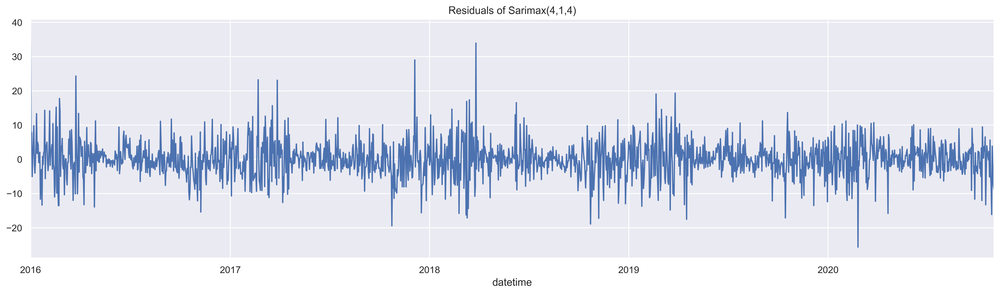

In [312]:
#Plotting residuals

df['res_sar_4_1_1'] = results_sarimax_4_1_4.resid.iloc[:]
df.res_sar_4_1_1.plot(figsize=(20,5))
plt.title("Residuals of Sarimax(4,1,4)")
plt.show()

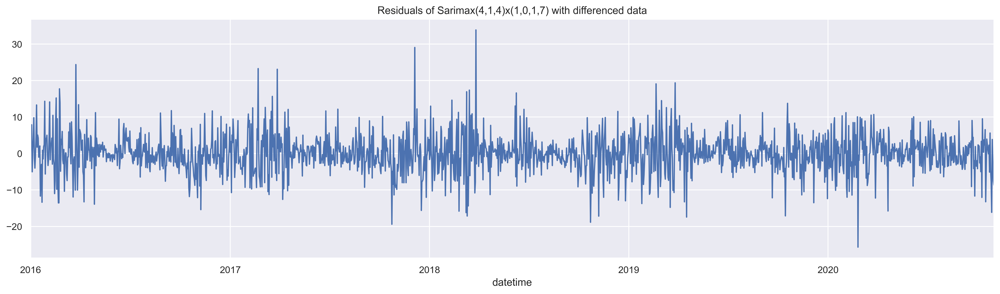

In [316]:
#with diff
df['res_sar_4_0_4_diff'] = np.concatenate(([0], results_sarimax_4_0_4_diff.resid))
df.res_sar_4_0_4_diff.plot(figsize=(20,5))
plt.title("Residuals of Sarimax(4,1,4)x(1,0,1,7) with differenced data")
plt.show()

In [322]:

# Testing stationarity of residuals
# test_statistic, p_value, used_lag, n_obs, critical_values, maximized_information_criterion = sts.adfuller(df.res_sar_4_1_4)
test_statistic, p_value, used_lag, n_obs, critical_values, maximized_information_criterion = sts.adfuller(df.res_sar_4_0_4_diff)
print("Test-statistic \t\t", test_statistic)
print("P-value \t\t", p_value)
print("\n")
for k,v in critical_values.items():
    if test_statistic < v:
        print("Data is stationary with a %.2f%% of confidence" % (1-(float(k.rstrip('%')))/100))
    else:
        print("There isn't enough proves to reject that data isn't stationary with a %.2f%% of confidence"% (1-(float(k.rstrip('%')))/100))

Test-statistic 		 -41.93327129470254
P-value 		 0.0


Data is stationary with a 0.99% of confidence
Data is stationary with a 0.95% of confidence
Data is stationary with a 0.90% of confidence


### Analyzing

In [323]:
forecast_sarimax_4_1_4 = results_sarimax_4_1_4.forecast(7)

sqrt(mean_squared_error(df_test['humidity'][0:7].values, forecast_sarimax_4_1_4))

15.003612295339966

In [327]:
forecast_sarimax_4_0_4_diff = results_sarimax_4_0_4_diff.forecast(7)

predictions_diff = inverse_difference(df.humidity, forecast_sarimax_4_0_4_diff, interval=1)
sqrt(mean_squared_error(df_test['humidity'][0:7].values, predictions_diff))

14.966666344985242

In [328]:
forecast_sarimax_2_1_2 = results_sarimax_2_1_2.forecast(7)

sqrt(mean_squared_error(df_test['humidity'][0:7].values, forecast_sarimax_2_1_2))

14.715997033356054

In [333]:
forecast_sarimax_1_1_1 =  results_sarimax_1_1_1.forecast(7)

sqrt(mean_squared_error(df_test['humidity'][0:7].values, forecast_sarimax_1_1_1))
# np.vstack(forecast_sarimax_1_1_1)

14.220358071939211

###
It appears SARIMAX_1_1_1_diff still beats all in predictions  check below

In [334]:
forecast_sarimax_1_1_1_diff = results_sarimax_1_1_1_diff.forecast(7)

predictions_diff = inverse_difference(df.humidity, forecast_sarimax_1_1_1_diff, interval=1)
np.vstack(predictions_diff)
# sqrt(mean_squared_error(df_test['humidity'][0:7].values, predictions_diff))

array([[58.22928828],
       [58.56890021],
       [58.99168466],
       [58.72928055],
       [58.61177259],
       [58.70874445],
       [59.09878735]])

### Directly using exogenous values on SARIMAX_1_1_1_diff

In [343]:
len(differenced)
len(df.dew)

diff_1 = np.concatenate(([0], differenced))

In [349]:
model_sarimax_1_1_1_diff_exg = SARIMAX(diff_1, exog=df.dew, order=(1,1,1), seasonal_order=(1,0,1,7))
results_sarimax_1_1_1_diff_exg = model_sarimax_1_1_1_diff_exg.fit()

In [350]:
print("\n LLR for Sarimax_model_1_1_1 = ", results_sarimax_1_1_1_diff_exg.llf, "\t AIC = ", results_sarimax_1_1_1_diff_exg.aic)


 LLR for Sarimax_model_1_1_1 =  -5535.938639146846 	 AIC =  11083.877278293692


In [353]:
model_sarimax_1_1_1_exg = SARIMAX(df.humidity, exog=df.dew, order=(1,1,1), seasonal_order=(1,0,1,7))
results_sarimax_1_1_1_exg = model_sarimax_1_1_1_exg.fit()

In [354]:
print("\n LLR for Sarimax_model_1_1_1_exg = ", results_sarimax_1_1_1_exg.llf, "\t AIC = ", results_sarimax_1_1_1_exg.aic)


 LLR for Sarimax_model_1_1_1_exg =  -4560.765760750852 	 AIC =  9133.531521501704


### SARIMAX(1,1,1)exg appears with least AIC AND HIGHTES LLR

In [359]:
#forecasting

forecast_sar_1_1_1_exg = results_sarimax_1_1_1_exg.forecast(7, exog=df_test['dew'][0:7])


np.vstack(forecast_sar_1_1_1_exg)

array([[56.36962562],
       [64.99580457],
       [63.57189702],
       [59.39928729],
       [53.44030434],
       [47.69415888],
       [52.61050549]])

### Amazing how rsme reduces drastically and better predictions are made
Best performance so far

In [360]:
print("RSME: ", sqrt(mean_squared_error(df_test['humidity'][0:7].values, forecast_sar_1_1_1_exg)))

RSME:  1.6032441085109979


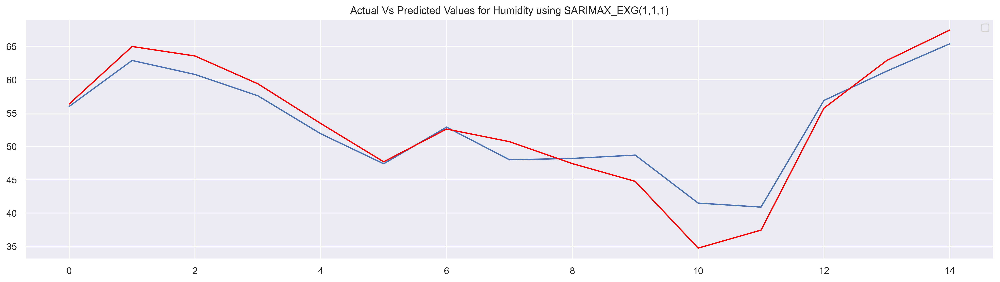

In [368]:
#plotting predictions on test data
pred_start_date = "2020-11-01"
pred_end_date = "2020-11-15"

yhat = results_sarimax_1_1_1_exg.predict(start=pred_start_date, end=pred_end_date, exog=df_test.dew)

plt.figure(figsize=(20,5))
plt.plot(df_test.humidity.tolist())
plt.plot(yhat.tolist(), color='red')
plt.title("Actual Vs Predicted Values for Humidity using SARIMAX_EXG(1,1,1)")
plt.legend('actual', 'predicted')
plt.show()


In [378]:
yhat
data_pred = pd.DataFrame(yhat)
data_pred

,predicted_mean
2020-11-01,56.369626
2020-11-02,64.995805
2020-11-03,63.571897
2020-11-04,59.399287
2020-11-05,53.440304
2020-11-06,47.694159
2020-11-07,52.610505
2020-11-08,50.716140
2020-11-09,47.424094
2020-11-10,44.758096


In [381]:
#create new dataframe to visualize actual vs predictions 

forecast = pd.DataFrame({"Actual_Humidity" : df_test['humidity'].values, "Forecast_Humidity" : np.round(data_pred['predicted_mean'].values, 2)}, index=df_test['datetime']) 

In [382]:
forecast

,Actual_Humidity,Forecast_Humidity
datetime,,
2020-11-01,56.0,56.37
2020-11-02,62.9,65.00
2020-11-03,60.8,63.57
2020-11-04,57.6,59.40
2020-11-05,51.9,53.44
2020-11-06,47.4,47.69
2020-11-07,52.9,52.61
2020-11-08,48.0,50.72
2020-11-09,48.2,47.42


### We have come to then end of this project.

Takeaways:
    1. AUTOREGRESSIVE MODELS ARE IMPORTANT IN UNDERSTANDING TIME SERIES DATA
    2. ARIMAX, SARIMAX MODELS CAN BE USED TO MODEL TIME SERIES DATA